<a href="https://colab.research.google.com/github/jintanabp/ComputerVision/blob/main/Easyocr_and_Keras_Test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install pytesseract
!pip install easyocr
!pip install keras-ocr -q
from google.colab import drive
drive.mount('/content/drive')

import easyocr
import keras_ocr
import pandas as pd
import numpy as np

from glob import glob
from tqdm.notebook import tqdm

import matplotlib.pyplot as plt
from PIL import Image

plt.style.use('ggplot')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 9.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 908.3/908.3 kB 16.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.2/307.2 kB 8.3 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylin

In [2]:
img_fns = glob('/content/drive/MyDrive/Colab Notebooks/opentopics/Detect Text in Images with Python/Medicine_data/*')

In [3]:
image_id = img_fns[8].split('/')[-1].split('.')[0]

In [8]:
# easyocr
reader = easyocr.Reader(['en'], gpu = True)

dfs = []
for img in tqdm(img_fns[:50]):
    result = reader.readtext(img)
    img_id = img.split('/')[-1].split('.')[0]
    img_df = pd.DataFrame(result, columns=['bbox','text','conf'])
    img_df['img_id'] = img_id
    dfs.append(img_df)
easyocr_df = pd.concat(dfs)

100%|██████████| 50/50 [00:55<00:00,  1.10s/it]


In [9]:
import pandas as pd
from tqdm import tqdm
import keras_ocr

# Define the text classification function
def classify_text(text):
    # Example rule-based classification
    if 'paracetamol' in text:
        return 'paracetamol'
    elif 'Paracetamol' in text:
        return 'paracetamol'
    else:
        return 'Unclassified'

# Initialize Keras OCR pipeline
pipeline = keras_ocr.pipeline.Pipeline()

# List to store dataframes
dfs = []

# Iterate through images
for img in tqdm(img_fns[:50]):
    # Perform text recognition
    results = pipeline.recognize([img])
    result = results[0]
    img_id = img.split('/')[-1].split('.')[0]

    # Create dataframe from OCR results
    img_df = pd.DataFrame(result, columns=['text', 'bbox'])
    img_df['img_id'] = img_id

    # Classify text and add category column
    img_df['category'] = img_df['text'].apply(classify_text)

    # Append dataframe to list
    dfs.append(img_df)

# Concatenate dataframes
kerasocr_df = pd.concat(dfs)

# Apply text classification function to 'text' column
kerasocr_df['classification'] = kerasocr_df['text'].apply(classify_text)

# Group by 'img_id' and find the most frequent category among non-'Unclassified' categories
img_labels = kerasocr_df[kerasocr_df['category'] != 'Unclassified'].groupby('img_id')['category'].agg(lambda x: x.value_counts().idxmax()).reset_index()

# For img_ids where all categories are 'Unclassified', find the most frequent category among all categories
unclassified_img_ids = set(kerasocr_df['img_id']) - set(img_labels['img_id'])
unclassified_labels = kerasocr_df[kerasocr_df['img_id'].isin(unclassified_img_ids)]['category'].value_counts().idxmax()
unclassified_df = pd.DataFrame({'img_id': list(unclassified_img_ids), 'category': [unclassified_labels]*len(unclassified_img_ids)})

# Concatenate the results
img_labels = pd.concat([img_labels, unclassified_df], ignore_index=True)

# Merge img_labels with kerasocr_df on 'img_id'
kerasocr_df = pd.merge(kerasocr_df, img_labels, on='img_id', how='left', suffixes=('', '_label'))

# Display the resulting DataFrame
# print(kerasocr_df)


# Group by 'img_id' and select one row for each group
grouped_data = kerasocr_df.groupby('img_id').first().reset_index()

# Display the resulting DataFrame with only 'img_id' and 'category_label' columns
print(grouped_data[['img_id', 'category_label']])


Looking for /root/.keras-ocr/craft_mlt_25k.h5
Looking for /root/.keras-ocr/crnn_kurapan.h5


  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 5s 5s/step


  2%|▏         | 1/50 [00:08<06:36,  8.08s/it]

1/1 [==============================] - 2s 2s/step


  4%|▍         | 2/50 [00:13<05:02,  6.31s/it]

1/1 [==============================] - 1s 1s/step


  6%|▌         | 3/50 [00:17<04:15,  5.44s/it]

1/1 [==============================] - 2s 2s/step


  8%|▊         | 4/50 [00:23<04:17,  5.61s/it]

1/1 [==============================] - 1s 1s/step


 10%|█         | 5/50 [00:27<03:40,  4.90s/it]

1/1 [==============================] - 1s 1s/step


 12%|█▏        | 6/50 [00:31<03:22,  4.60s/it]

1/1 [==============================] - 3s 3s/step


 14%|█▍        | 7/50 [00:37<03:40,  5.12s/it]

1/1 [==============================] - 1s 1s/step


 16%|█▌        | 8/50 [00:41<03:16,  4.69s/it]

1/1 [==============================] - 1s 1s/step


 18%|█▊        | 9/50 [00:44<03:00,  4.41s/it]

1/1 [==============================] - 6s 6s/step


 20%|██        | 10/50 [00:53<03:44,  5.62s/it]

1/1 [==============================] - 1s 1s/step


 22%|██▏       | 11/50 [00:57<03:19,  5.12s/it]

1/1 [==============================] - 2s 2s/step


 24%|██▍       | 12/50 [01:01<03:08,  4.96s/it]

1/1 [==============================] - 2s 2s/step


 26%|██▌       | 13/50 [01:08<03:26,  5.57s/it]

1/1 [==============================] - 1s 1s/step


 28%|██▊       | 14/50 [01:12<03:03,  5.10s/it]

1/1 [==============================] - 1s 866ms/step


 30%|███       | 15/50 [01:16<02:41,  4.61s/it]

1/1 [==============================] - 1s 716ms/step


 32%|███▏      | 16/50 [01:17<01:57,  3.46s/it]

1/1 [==============================] - 1s 1s/step


 34%|███▍      | 17/50 [01:22<02:12,  4.01s/it]

1/1 [==============================] - 0s 487ms/step


 36%|███▌      | 18/50 [01:22<01:35,  2.97s/it]

1/1 [==============================] - 2s 2s/step


 38%|███▊      | 19/50 [01:27<01:45,  3.39s/it]

1/1 [==============================] - 2s 2s/step


 40%|████      | 20/50 [01:33<02:04,  4.16s/it]

1/1 [==============================] - 1s 869ms/step


 42%|████▏     | 21/50 [01:34<01:33,  3.21s/it]

1/1 [==============================] - 1s 839ms/step


 44%|████▍     | 22/50 [01:38<01:37,  3.48s/it]

1/1 [==============================] - 1s 627ms/step


 46%|████▌     | 23/50 [01:41<01:31,  3.40s/it]

1/1 [==============================] - 0s 487ms/step


 48%|████▊     | 24/50 [01:42<01:06,  2.55s/it]

1/1 [==============================] - 2s 2s/step


 50%|█████     | 25/50 [01:46<01:20,  3.23s/it]

1/1 [==============================] - 1s 1s/step


 52%|█████▏    | 26/50 [01:52<01:31,  3.83s/it]

1/1 [==============================] - 3s 3s/step


 54%|█████▍    | 27/50 [01:57<01:39,  4.31s/it]

1/1 [==============================] - 3s 3s/step


 56%|█████▌    | 28/50 [02:03<01:46,  4.84s/it]

1/1 [==============================] - 2s 2s/step


 58%|█████▊    | 29/50 [02:09<01:46,  5.05s/it]

1/1 [==============================] - 2s 2s/step


 60%|██████    | 30/50 [02:13<01:38,  4.92s/it]

1/1 [==============================] - 2s 2s/step


 62%|██████▏   | 31/50 [02:19<01:35,  5.04s/it]

1/1 [==============================] - 2s 2s/step


 64%|██████▍   | 32/50 [02:24<01:31,  5.06s/it]

1/1 [==============================] - 2s 2s/step


 66%|██████▌   | 33/50 [02:28<01:23,  4.93s/it]

1/1 [==============================] - 3s 3s/step


 68%|██████▊   | 34/50 [02:36<01:33,  5.82s/it]

1/1 [==============================] - 1s 827ms/step


 70%|███████   | 35/50 [02:40<01:16,  5.07s/it]

1/1 [==============================] - 2s 2s/step


 72%|███████▏  | 36/50 [02:45<01:10,  5.07s/it]

1/1 [==============================] - 1s 1s/step


 74%|███████▍  | 37/50 [02:47<00:54,  4.16s/it]

1/1 [==============================] - 2s 2s/step


 76%|███████▌  | 38/50 [02:52<00:53,  4.47s/it]

1/1 [==============================] - 1s 1s/step


 78%|███████▊  | 39/50 [02:56<00:47,  4.35s/it]

1/1 [==============================] - 2s 2s/step


 80%|████████  | 40/50 [03:03<00:51,  5.15s/it]

1/1 [==============================] - 1s 833ms/step


 82%|████████▏ | 41/50 [03:06<00:41,  4.61s/it]

1/1 [==============================] - 1s 831ms/step


 84%|████████▍ | 42/50 [03:10<00:33,  4.23s/it]

1/1 [==============================] - 0s 433ms/step


 86%|████████▌ | 43/50 [03:11<00:22,  3.28s/it]

1/1 [==============================] - 1s 841ms/step


 88%|████████▊ | 44/50 [03:12<00:15,  2.58s/it]

1/1 [==============================] - 1s 1s/step


 90%|█████████ | 45/50 [03:17<00:16,  3.32s/it]

1/1 [==============================] - 1s 1s/step


 92%|█████████▏| 46/50 [03:20<00:13,  3.47s/it]

1/1 [==============================] - 1s 1s/step


 94%|█████████▍| 47/50 [03:24<00:10,  3.55s/it]

1/1 [==============================] - 3s 3s/step


 96%|█████████▌| 48/50 [03:33<00:10,  5.01s/it]

1/1 [==============================] - 1s 1s/step


 98%|█████████▊| 49/50 [03:37<00:04,  4.76s/it]

1/1 [==============================] - 4s 4s/step


100%|██████████| 50/50 [03:43<00:00,  4.48s/it]

        img_id category_label
0     images10    paracetamol
1     images20    paracetamol
2    images209   Unclassified
3     images21    paracetamol
4    images212   Unclassified
5    images230   Unclassified
6    images231   Unclassified
7    images234   Unclassified
8    images240   Unclassified
9    images241    paracetamol
10   images247    paracetamol
11   images249   Unclassified
12   images255    paracetamol
13   images259    paracetamol
14   images260    paracetamol
15   images261    paracetamol
16   images262   Unclassified
17    images30    paracetamol
18   images310   Unclassified
19   images319   Unclassified
20   images320   Unclassified
21   images325   Unclassified
22   images332    paracetamol
23   images345   Unclassified
24    images35    paracetamol
25  images4031   Unclassified
26  images4045   Unclassified
27  images4047   Unclassified
28  images4055   Unclassified
29  images4058   Unclassified
30  images4066   Unclassified
31  images4083   Unclassified
32  images

In [10]:
import matplotlib.pyplot as plt
import numpy as np

def plot_compare(img_fn, easyocr_df, kerasocr_df):
    img_id = img_fn.split('/')[-1].split('.')[0]
    fig, axs = plt.subplots(1, 2, figsize=(20, 10))

    easy_results = easyocr_df.query('img_id == @img_id')[['text','bbox']].values.tolist()
    easy_results = [(x[0], np.array(x[1])) for x in easy_results]
    keras_ocr.tools.drawAnnotations(plt.imread(img_fn),
                                    easy_results, ax=axs[0])
    axs[0].set_title('easyocr results', fontsize=24)

    keras_results = kerasocr_df.query('img_id == @img_id')[['text','bbox']].values.tolist()
    keras_results = [(x[0], np.array(x[1])) for x in keras_results]
    keras_ocr.tools.drawAnnotations(plt.imread(img_fn),
                                    keras_results, ax=axs[1])
    axs[1].set_title('keras_ocr results', fontsize=24)

    # Adjust layout to add spacing between subplots
    plt.subplots_adjust(wspace=0.4)  # Adjust the horizontal spacing between subplots
    plt.show()


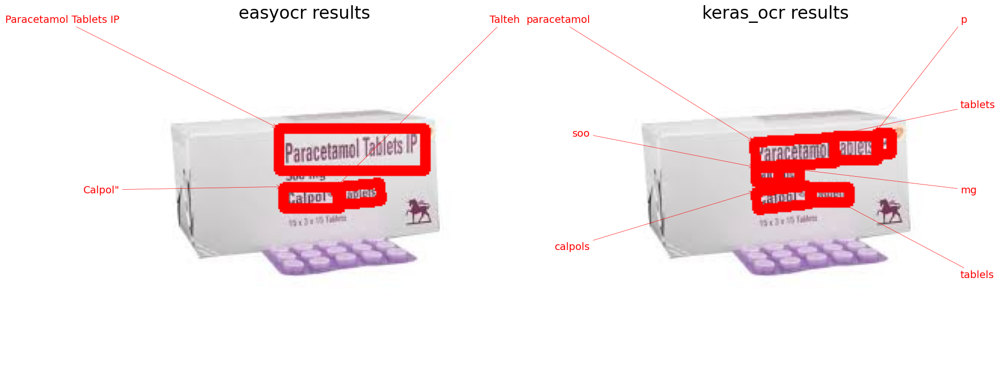

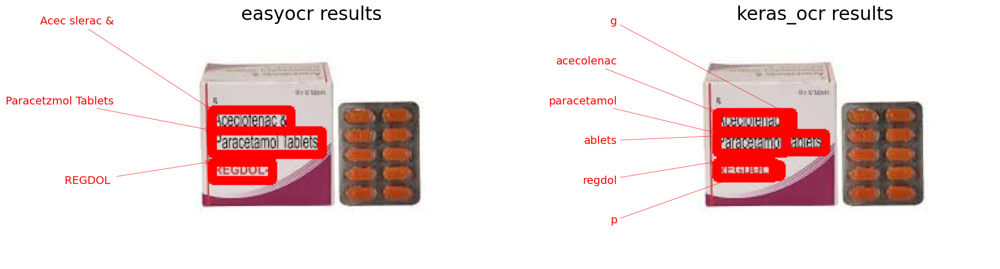

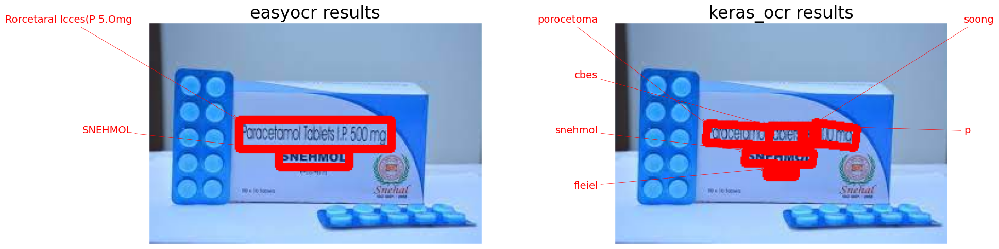

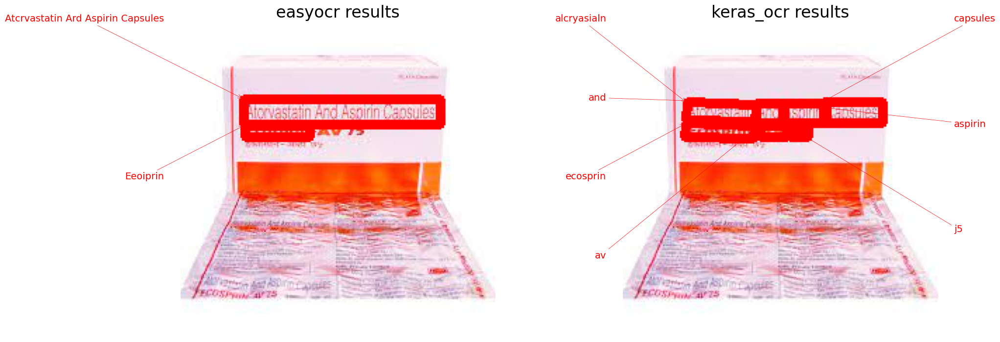

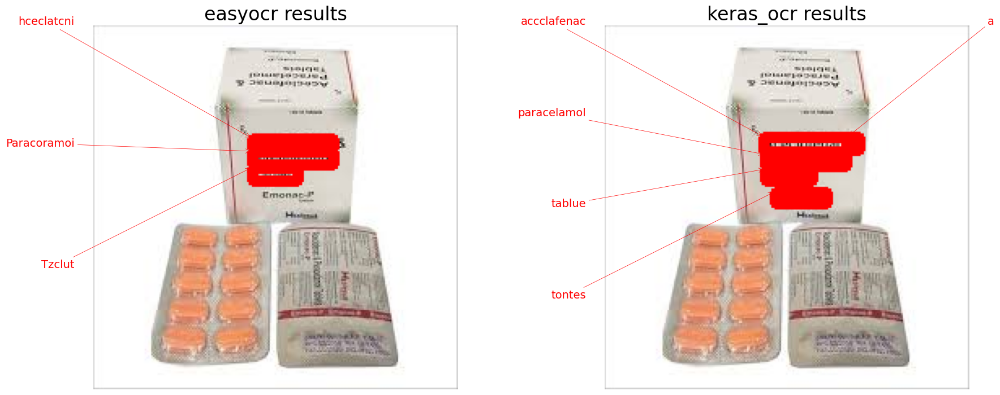

...

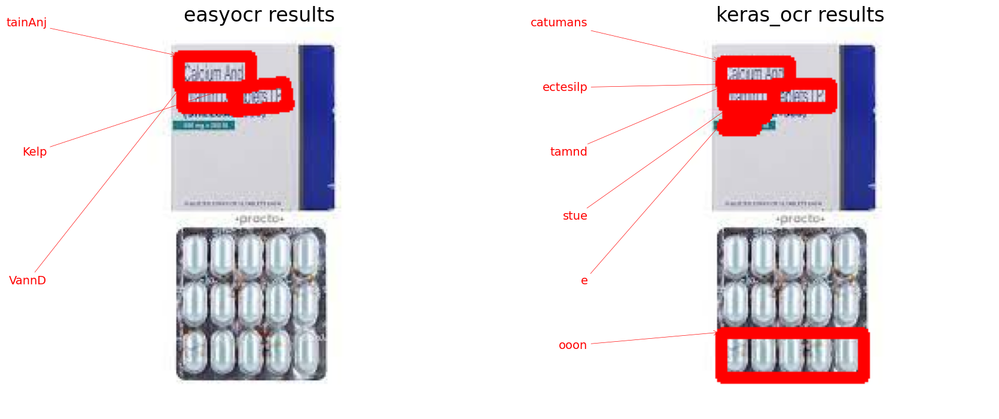

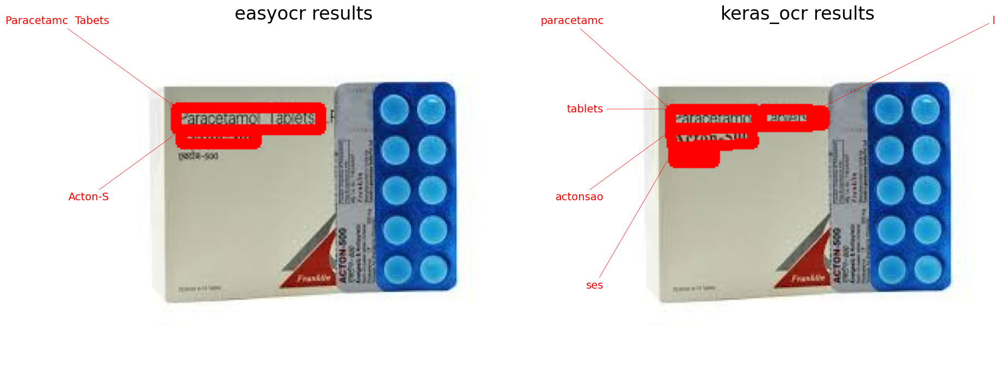

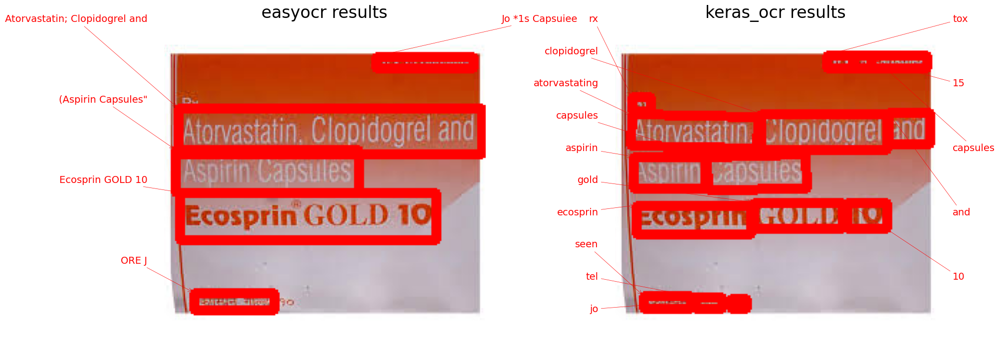

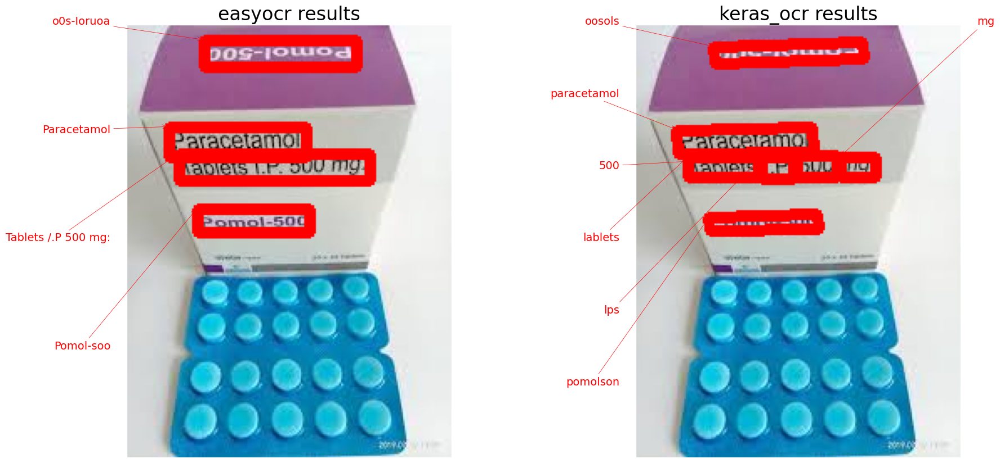

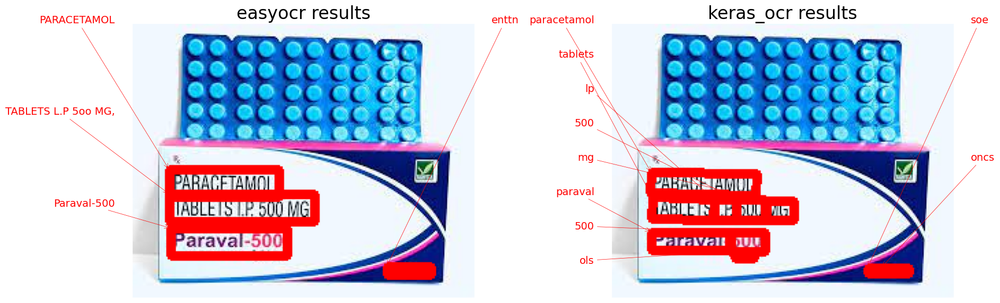

In [12]:
# Loop over results
for img_fn in img_fns[:50]:
    plot_compare(img_fn, easyocr_df, kerasocr_df)